## Extract File

In [10]:
# Thư viện dùng để giải nén file

!pip install patool

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [11]:
import os
import patoolib

# Đường dẫn chứa Dataset
path = "/content/drive/MyDrive/VTCA /Project AI/CV/Coconuts Dataset"
%cd path

# Giải nén file .rar
patoolib.extract_archive(path + "/Coconut Dataset.rar")


[Errno 2] No such file or directory: 'path'
/content/drive/MyDrive/VTCA /Coconuts Dataset
patool: Extracting /content/drive/MyDrive/VTCA /Project AI/CV/Coconuts Dataset/Coconut Dataset.rar ...
patool: running /usr/bin/unrar x -- "/content/drive/MyDrive/VTCA /Project AI/CV/Coconuts Dataset/Coconut Dataset.rar"
patool:     with cwd='./Unpack_xthjasb4'
patool: ... /content/drive/MyDrive/VTCA /Project AI/CV/Coconuts Dataset/Coconut Dataset.rar extracted to `Coconuts'.


'Coconuts'

Kiểm tra số lượng thư mục con có trong Dataset

In [12]:
os.listdir('Coconuts')

['Dừa nứt 2', 'Dừa tốt 1', 'Màu NG 3']

## Import Library

In [13]:
import numpy as np 
import pandas as pd
# OpenCV
import cv2 
from matplotlib import pyplot as plt 
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray

import warnings
warnings.filterwarnings('ignore')

## All Functions

### get_subfile

In [14]:
def get_subfiles(dir, ExtensionList = []):
    
    """
    Hàm get_subfiles dùng để truy xuất dữ liệu trong các thư mục con
    - ExtensionList: chứa các định dạng ảnh như .jpeg, .png, ...
    """
    # Lấy file ảnh trong thư mục
    # all_names sẽ chứa tất cả file ảnh trong thư mục (Dừa tốt 1, Dừa tốt 2,....)
    all_names = next(os.walk(dir))[2]
    result_names = []
    if(len(ExtensionList) > 0):
      for filename in all_names:
        # Tách tên file và extension
        fname, fextension = os.path.splitext(filename)
        # Nếu ext nằm trong ExtensionList đề xuất
        if any(ext in fextension for ext in ExtensionList):
          result_names.append(dir + "/" + filename)
    else:
      result_names = [dir + "/" + x for x in all_names]
    
    print(f"There are {len(result_names)} files are found")
    print("Here is some samples :")
    [print(x) for x in result_names[0: min(len(result_names), 5)]]
    return result_names

In [15]:
GoodSamples = get_subfiles("Coconuts/Dừa tốt 1", ["jpg"])

There are 28 files are found
Here is some samples :
Coconuts/Dừa tốt 1/013ccf3e638595dbcc9454.jpg
Coconuts/Dừa tốt 1/0551eedbd3a01afe43b17.jpg
Coconuts/Dừa tốt 1/0a4efd674d0b8455dd1a42.jpg
Coconuts/Dừa tốt 1/15b2f239cf42061c5f538.jpg
Coconuts/Dừa tốt 1/20eb34a074e0bcbee5f165.jpg


In [16]:
NotGoodASamples = get_subfiles("Coconuts/Dừa nứt 2", ["jpg"])

There are 10 files are found
Here is some samples :
Coconuts/Dừa nứt 2/0b92541d2b66e238bb7717.jpg
Coconuts/Dừa nứt 2/30b29e37e14c2812715d13.jpg
Coconuts/Dừa nứt 2/494d28ca57b19eefc7a014.jpg
Coconuts/Dừa nứt 2/57c8bb65c41e0d40540f21.jpg
Coconuts/Dừa nứt 2/5b4a91e5ee9e27c07e8f22.jpg


In [17]:
NotGoodBSamples = get_subfiles("Coconuts/Màu NG 3", ["jpg"])

There are 39 files are found
Here is some samples :
Coconuts/Màu NG 3/02e8f51d635eab00f24f107.jpg
Coconuts/Màu NG 3/08ae2275b4367c682527114.jpg
Coconuts/Màu NG 3/10af5e0a2171e82fb16019.jpg
Coconuts/Màu NG 3/15b039257a65b23beb743.jpg
Coconuts/Màu NG 3/1990b57d233eeb60b22f100.jpg


### ShowImage

In [20]:
def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.00, HeightSpace = 0.00):
    """
    ShowImage là hàm có thể show nhiều ảnh cùng 1 lúc.
    - ImageList: danh sách ảnh.
    - nRows, nCols: số dòng và số cột thể hiện ảnh.
    VD: có 6 ảnh muốn thể hiện trên 2 dòng, 3 cột thì set nRows = 2, nCols = 3
    - WidthSpace, HeightSpace: khoảng cách rộng và cao giữa các hình.
    """
    from matplotlib import pyplot as plt 
    import matplotlib.gridspec as gridspec
    
    # Định nghĩa lưới chứa các ánh
    gs = gridspec.GridSpec(nRows, nCols)     
    gs.update(wspace=WidthSpace, hspace=HeightSpace)
    plt.figure(figsize=(20,20))
    for i in range(len(ImageList)):
        plt.subplot(nRows, nCols,i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')

    plt.show()

Example: ShowImage function

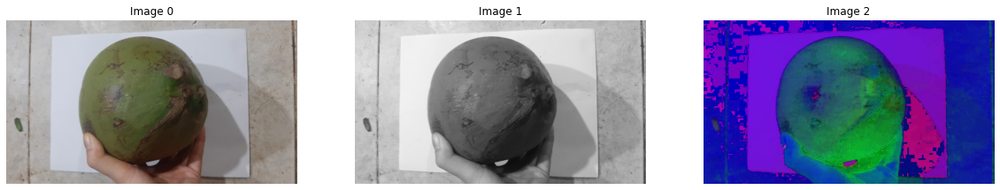

In [22]:
filepath = NotGoodBSamples[0]
# Ảnh RGB
image_RGB = imread(filepath)
# Ảnh xám
image_GRAY = cv2.cvtColor(image_RGB, cv2.COLOR_RGB2GRAY)
# Ảnh HSV
image_HSV = cv2.cvtColor(image_RGB, cv2.COLOR_RGB2HSV)
ChannelList = [image_RGB, image_HSV, image_GRAY]
ShowImage([image_RGB, image_GRAY, image_HSV], 1, 3)

Example: Show HSV Image

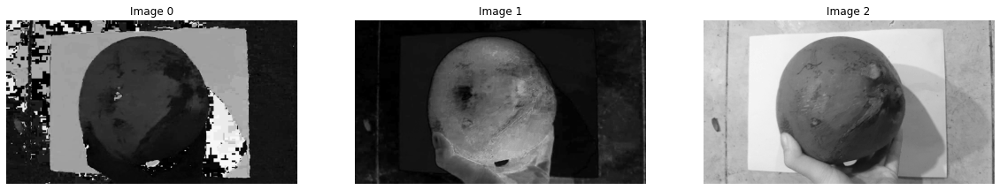

In [23]:
# [:,:,0]: Lấy kênh Hue
# [:,:,1]: Lấy kênh Saturation
# [:,:,2]: Lấy kênh Value

ShowImage([image_HSV[:,:,0], image_HSV[:,:,1], image_HSV[:,:,2]], 1, 3)

Example: Show RGB Image

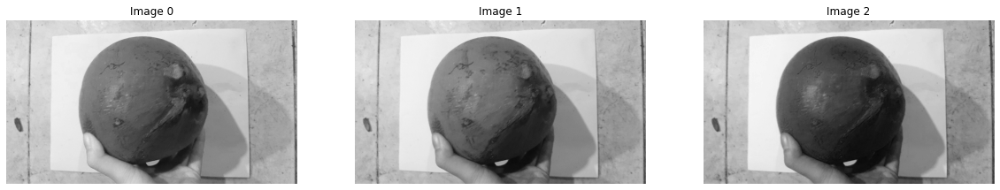

In [24]:
# [:,:,0]: Lấy kênh Red
# [:,:,1]: Lấy kênh Green
# [:,:,2]: Lấy kênh Blue

ShowImage([image_RGB[:,:,0], image_RGB[:,:,1], image_RGB[:,:,2]], 1, 3)

### ResizeImage

In [25]:
def ResizeImage(image, wresize = 0, hresize = 0):
    """
    ResizeImage là hàm tăng/giảm kích thước bức ảnh.
    - image: bức ảnh đầu vào.
    - wresize: Nếu chọn chiều rộng bằng 1 giá trị nào đó thì vẫn sẽ giữ tỉ lệ ảnh và tính lại chiều cao.
    - hresize: Nếu chọn chiều cao bằng 1 giá trị nào đó thì vẫn sẽ giữ tỉ lệ ảnh và tính lại chiều rộng.
    """
    from skimage.transform import rescale, resize
    OrigWidth, OrigHeight = float(image.shape[1]), float(image.shape[0])

    if((wresize == 0) & (hresize == 0)):
        return image
    if(wresize == 0):
        wresize = int((OrigWidth * hresize)/OrigHeight)
    if(hresize == 0):
        hresize = int((OrigHeight * wresize)/OrigWidth)
    # cv2.INTER_NEAREST: resize ảnh bằng cách thu những điểm lân cận.
    resize_image = cv2.resize(image, (wresize, hresize), interpolation = cv2.INTER_NEAREST) 
    return resize_image

Example: ResizeImage function

In [27]:
image_HSV_new = ResizeImage(image_HSV, wresize = 500, hresize= 0)

print(f"Ảnh gốc: {image_HSV.shape}")
print(f"Ảnh scale: {image_HSV_new.shape}")

Ảnh gốc: (720, 1280, 3)
Ảnh scale: (281, 500, 3)


### ShowHistogram

In [28]:
def ShowHistogram(image, Title = "Color Histogram", ChannelList = ["Channel 1", "Channel 2", "Channel 3"]):
  """
  ShowHistogram là hàm dùng để trực quan hóa phân bố số lần xuất hiện của điểm ảnh từ 0 → 255.
  - image: bức ảnh đầu vào.
  - Title: tên Histogram.
  - ChannelList: tên các kênh màu
  """
  import matplotlib.pyplot as plt
  # Chia khoảng gai
  from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

  fig, ax = plt.subplots(figsize=(20, 5))

  if(len(image.shape) == 3):
    color = ('r', 'g', 'b')
    for channel,col in enumerate(color):
        # cv2.calHist: dùng để thống kê số lần xuất hiện của từng giá trị điểm ảnh.
        histr = cv2.calcHist([image],[channel],None,[256],[0,256])
        ax.plot(histr,color = col, label = ChannelList[channel])
        
    plt.title(Title)
    plt.legend()
  else:
    histr = cv2.calcHist([image],[0],None,[256],[0,256])
    plt.plot(histr,color = "gray", label = "Gray")
    plt.title("Gray Histogram")
    plt.legend()

  # Set axis ranges; by default this will put major ticks every 25.
  ax.set_xlim(0, 255)

  # Từ 0 -> 255, chia khoảng cách 20 đơn vị
  ax.xaxis.set_major_locator(MultipleLocator(20))

  # Từ 0 -> 20, chia khoảng ra làm 4 nữa (20/4 = 5)
  ax.xaxis.set_minor_locator(AutoMinorLocator(4))

  # Turn grid on for both major and minor ticks and style minor slightly
  # differently.
  ax.grid(which='major', color='#CCCCCC', linestyle='--')
  ax.grid(which='minor', color='#CCCCCC', linestyle=':')
  plt.show()

Example: ShowHistogram function

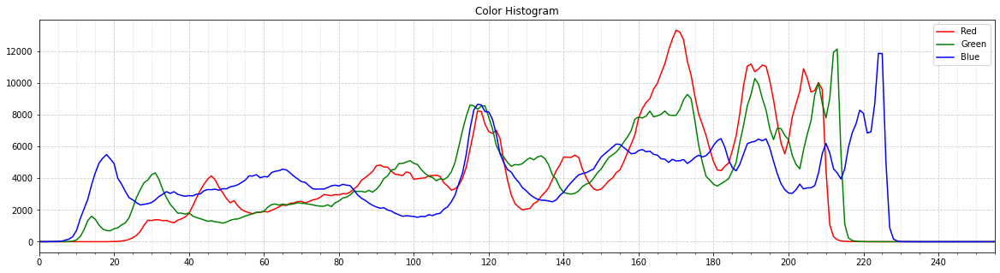

In [29]:
ShowHistogram(image_RGB, ChannelList = ["Red", "Green", "Blue"])

### ReadImage

In [31]:
def ReadImage(filepath, info_resize = (0,0), info_display= True):
  """
  Hàm ReadImage dùng để đọc ảnh. Trong hàm này chứa 2 hàm:
    + ResizeImage: dùng để resize bức ảnh về kích thước cố định.
    + ShowImage: show ảnh ra.
  """
  image_RGB = imread(filepath)
  image_RGB = ResizeImage(image_RGB, wresize = info_resize[0], hresize = info_resize[1])
  image_GRAY = cv2.cvtColor(image_RGB, cv2.COLOR_RGB2GRAY)
  image_HSV = cv2.cvtColor(image_RGB, cv2.COLOR_RGB2HSV)
  ChannelList = [image_RGB, image_GRAY, image_HSV]
  print(f"{filepath} shape: {image_RGB.shape}")

  if (info_display):
    ShowImage([image_RGB, image_GRAY, image_HSV], 1, 3)
  return ChannelList

Example: ReadImage function

Coconuts/Dừa tốt 1/013ccf3e638595dbcc9454.jpg shape: (960, 720, 3)


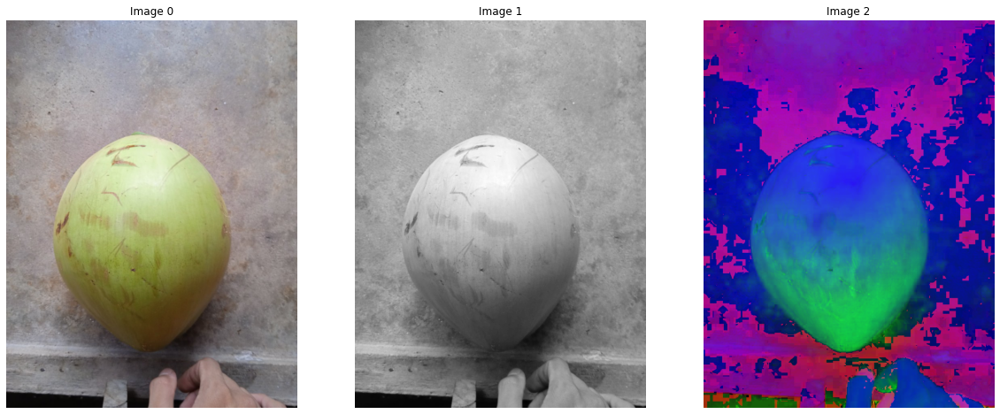

In [32]:
ChannelListG = ReadImage(GoodSamples[0])

Example: ReadImage function with reszie image - Good Samples

Coconuts/Dừa tốt 1/013ccf3e638595dbcc9454.jpg shape: (266, 200, 3)


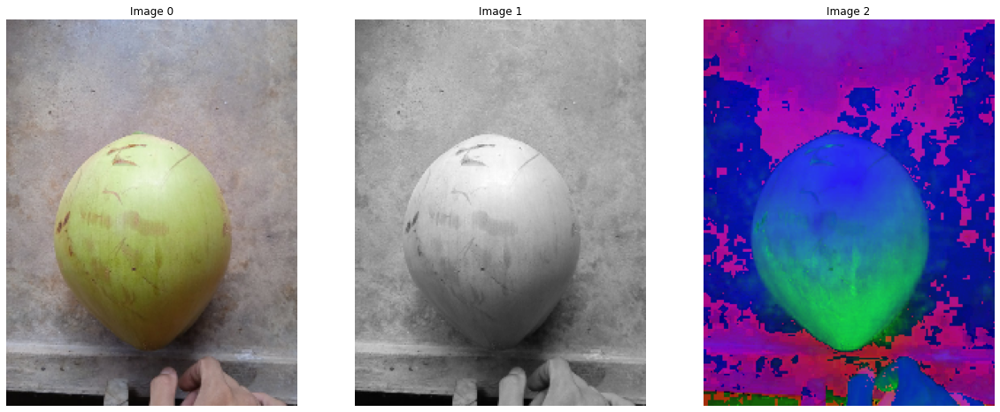

In [34]:
ChannelListG = ReadImage(GoodSamples[0], info_resize = (200, 0))

Example: ReadImage function with reszie image - Not Good Samples A

Coconuts/Dừa nứt 2/0b92541d2b66e238bb7717.jpg shape: (266, 200, 3)


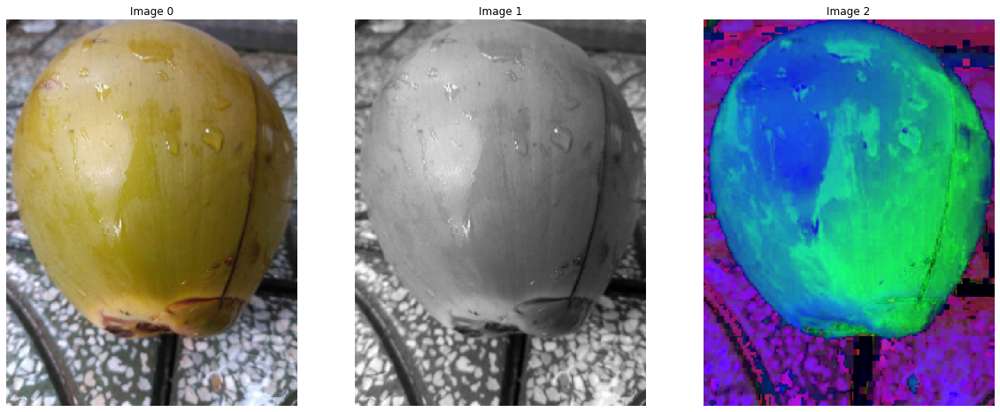

In [33]:
ChannelNGA = ReadImage(NotGoodASamples[0], info_resize = (200,0))

Example: ReadImage function with reszie image - Not Good Samples B

Coconuts/Màu NG 3/02e8f51d635eab00f24f107.jpg shape: (112, 200, 3)


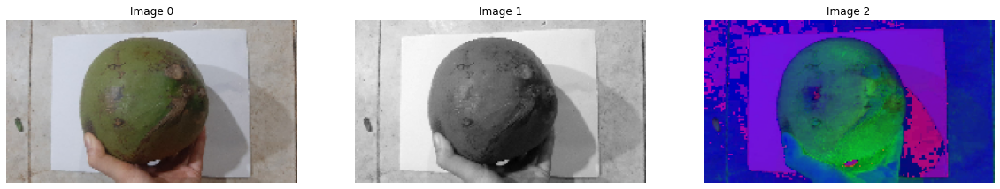

In [35]:
ChannelNGB = ReadImage(NotGoodBSamples[0], info_resize = (200,0))

### ShowImageInfo

In [36]:
def ShowImageInfo(ChannelList):
  image_RGB = ChannelList[0]
  image_GRAY = ChannelList[1]
  image_HSV = ChannelList[2]
  ShowHistogram(image_RGB, "RGB Channel", ["Red Channel", "Green Channel", "Blue Channel"])
  ShowHistogram(image_GRAY)
  ShowHistogram(image_HSV, "HSV Channel", ["Hue Channel", "Saturation Channel", "Value Channel"])
  

Example: ShowImageInfo function - Good Samples

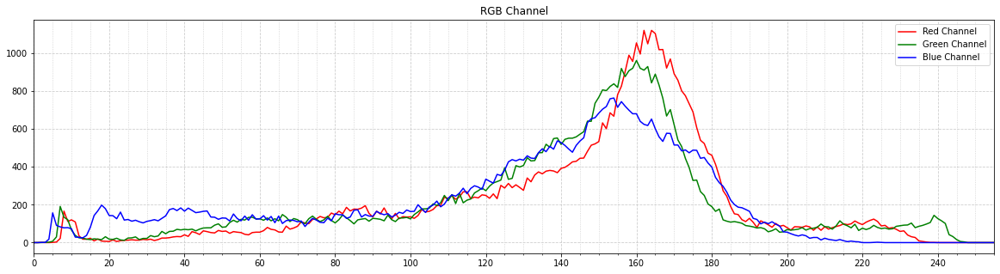

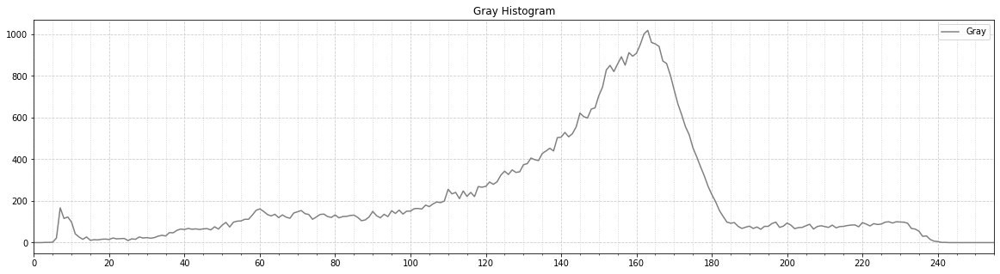

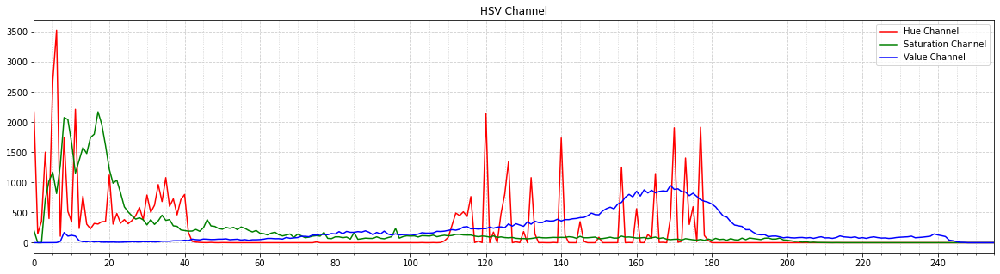

In [37]:
ShowImageInfo(ChannelListG)

Example: ShowImageInfo function - Not Good Samples A

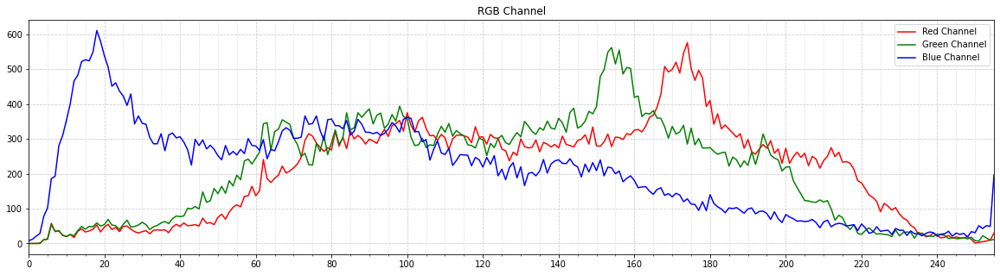

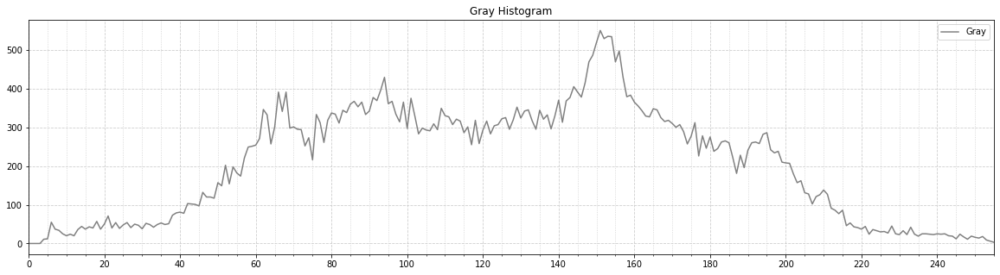

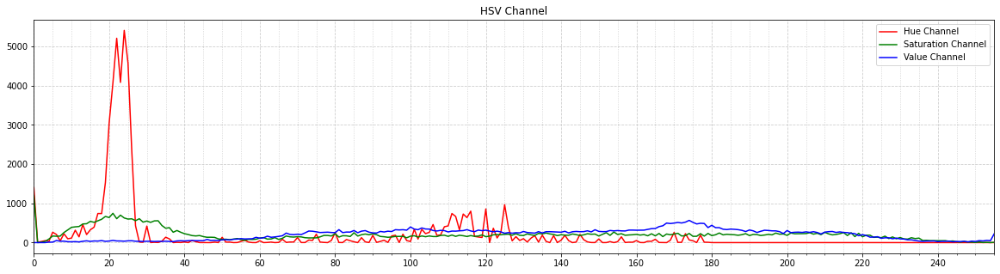

In [38]:
ShowImageInfo(ChannelNGA)

Example: ShowImageInfo function - Not Good Samples B

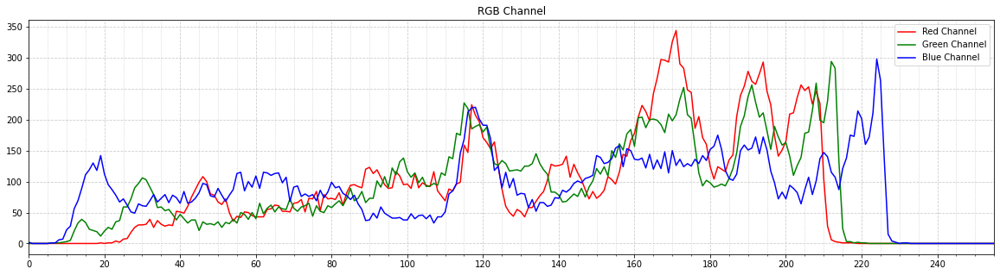

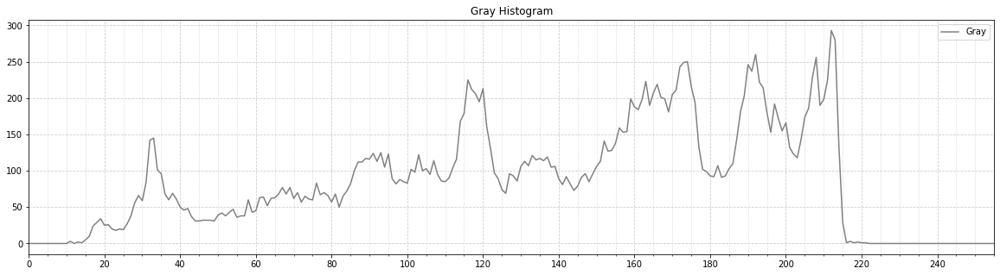

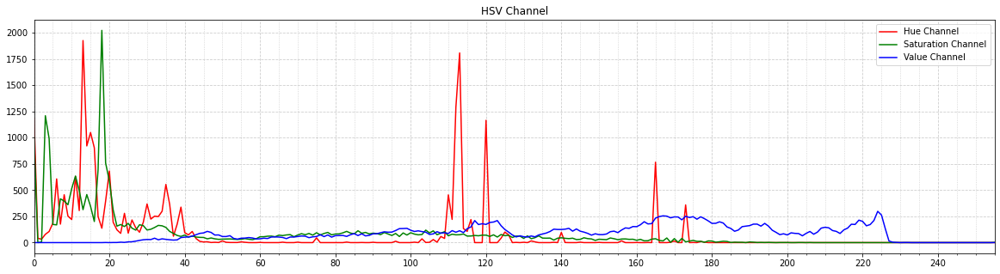

In [39]:
ShowImageInfo(ChannelNGB)

## One Image Analysis

Coconuts/Dừa tốt 1/013ccf3e638595dbcc9454.jpg shape: (266, 200, 3)


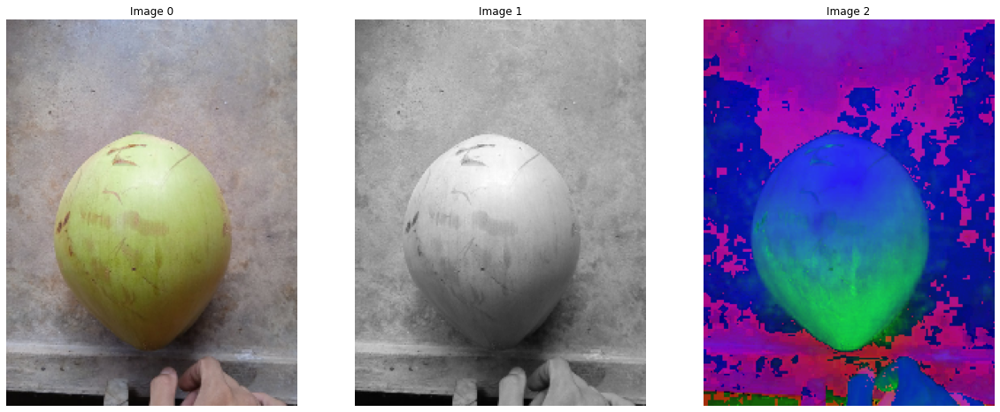

(266, 200, 3)


In [40]:
ChannelListG = ReadImage(GoodSamples[0], info_resize = (200, 0))

image_RGB = ChannelListG[0]
image_GRAY = ChannelListG[1]
image_HSV = ChannelListG[2]

image = image_HSV.copy()
print(image.shape)

### Choosing threshold

Trying chosing threshold

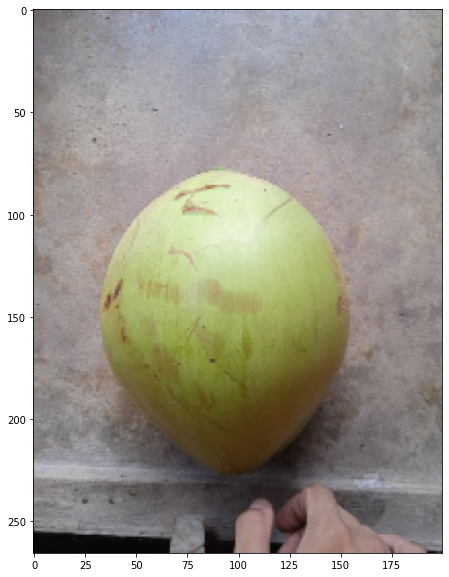

In [41]:
image = image_RGB.copy()

left, right = 35, 170
top, bottom = 75, 220

plt.figure(figsize = (10,10))
plt.imshow(image)

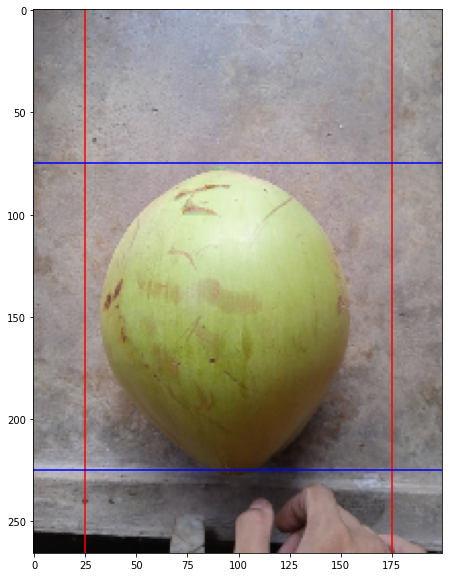

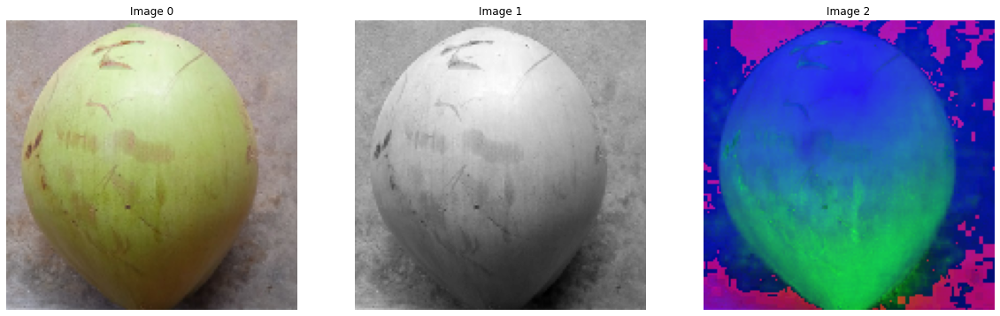

In [43]:
image = image_RGB.copy()

left, right = 25, 175
top, bottom = 75, 225

plt.figure(figsize = (10,10))
plt.imshow(image)

# Đường dọc left và right
plt.axvline(x = left, color = 'red')
plt.axvline(x = right, color = 'red')

# Đường ngang top và bottom
plt.axhline(y = top, color = 'blue')
plt.axhline(y = bottom, color = 'blue')

# Show ảnh cùng các đường line
plt.show()

# Crop các bức ảnh
img_crop_RGB = image_RGB[top:bottom, left:right]
img_crop_GRAY = image_GRAY[top:bottom, left:right]
img_crop_HSV = image_HSV[top:bottom, left:right]

ShowImage([img_crop_RGB, img_crop_GRAY, img_crop_HSV], 1, 3)

### Show Histograms of crop images

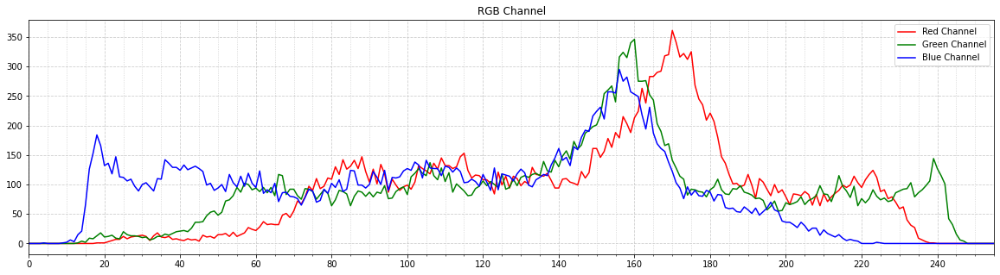

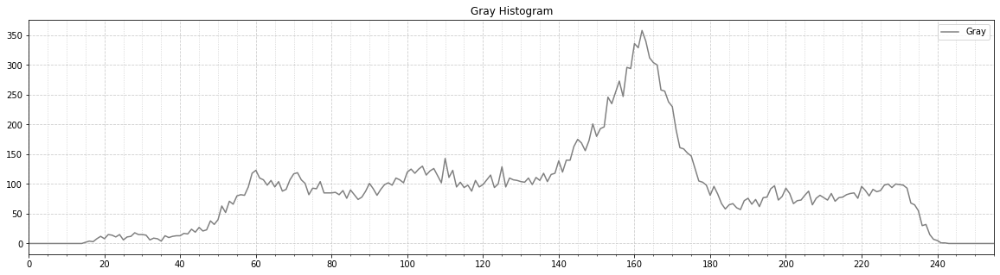

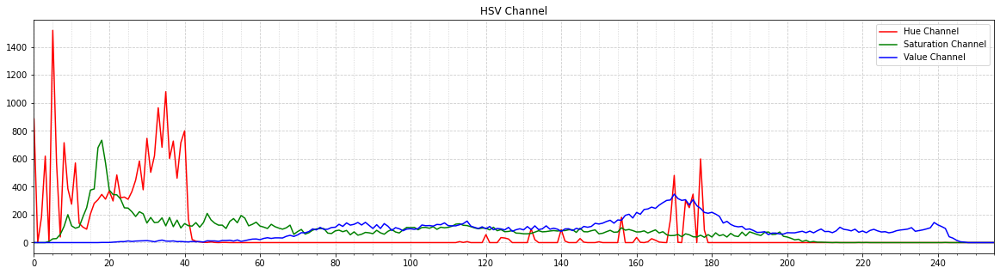

In [44]:
ShowHistogram(img_crop_RGB, "RGB Channel", ["Red Channel", "Green Channel", "Blue Channel"])
ShowHistogram(img_crop_GRAY)
ShowHistogram(img_crop_HSV, "HSV Channel", ["Hue Channel", "Saturation Channel", "Value Channel"])


=> Rất khó để segment trái dừa bằng kênh màu RGB nên ta sẽ segment theo kênh màu HSV (cụ thể là dùng kênh Hue từ 0 -> 45)

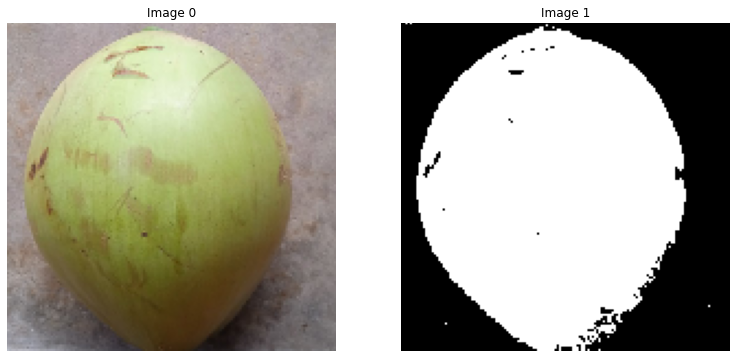

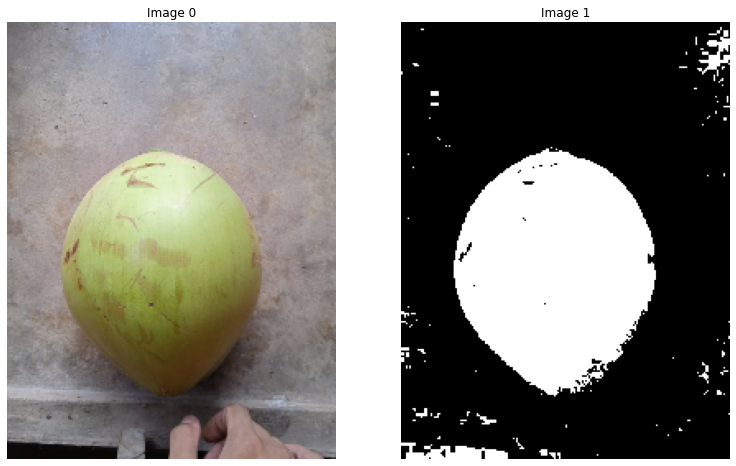

In [45]:
thresh = (15, 45)

# Kênh màu Hue của ảnh img_crop_HSV
channel = img_crop_HSV[:, :, 0] # Ma trận 1 chiều

# Ảnh binary
mask_crop = (channel > thresh[0]) & (channel < thresh[1])

# Kênh màu Hue của ảnh image_HSV
channel = image_HSV[:, :, 0] # Ma trận 1 chiều

# Ảnh binary
mask_full = (channel > thresh[0]) & (channel < thresh[1])

ShowImage([img_crop_RGB, mask_crop], 1, 3)
ShowImage([image_RGB, mask_full], 1, 3)

=> Có thể dùng Thuật toán Otsu để chọn ngưỡng tự động thay vì chọn ngưỡng bằng cách thử sai.

### Trying threshold in all images (Good, Not Good A, Not Good B)

Good Coconut

Good Coconut.jpg shape: (400, 300, 3)


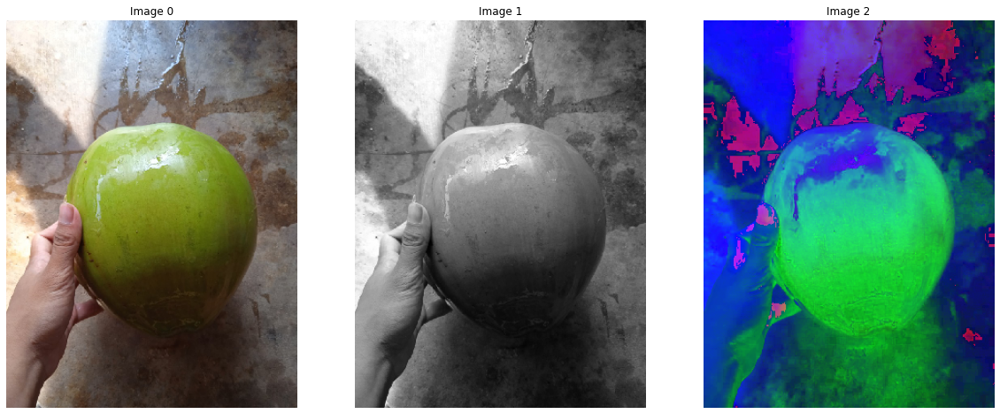

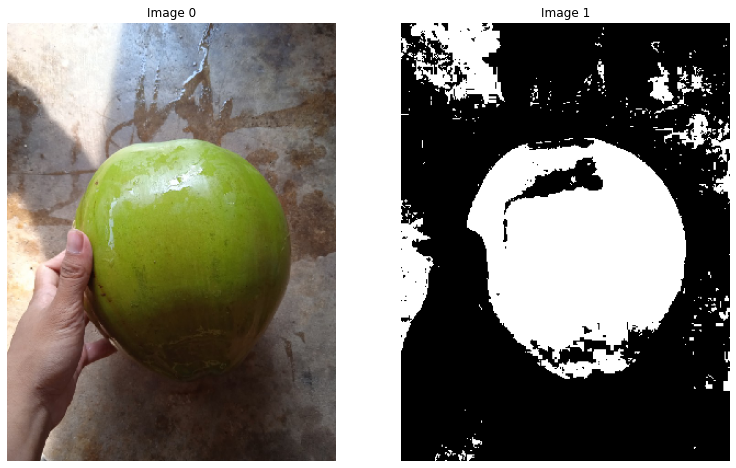

In [48]:
ChannelListG_Test = ReadImage('Good Coconut.jpg', info_resize = (300,0))
image_RGB = ChannelListG_Test[0]
image_GRAY = ChannelListG_Test[1]
image_HSV = ChannelListG_Test[2]

thresh = (15,45)
channel = image_HSV[:,:,0]
mask_full = (channel > thresh[0]) & (channel < thresh[1])
ShowImage([image_RGB, mask_full], 1, 3)

NG-A Coconut

NG-A Coconut.jpg shape: (400, 300, 3)


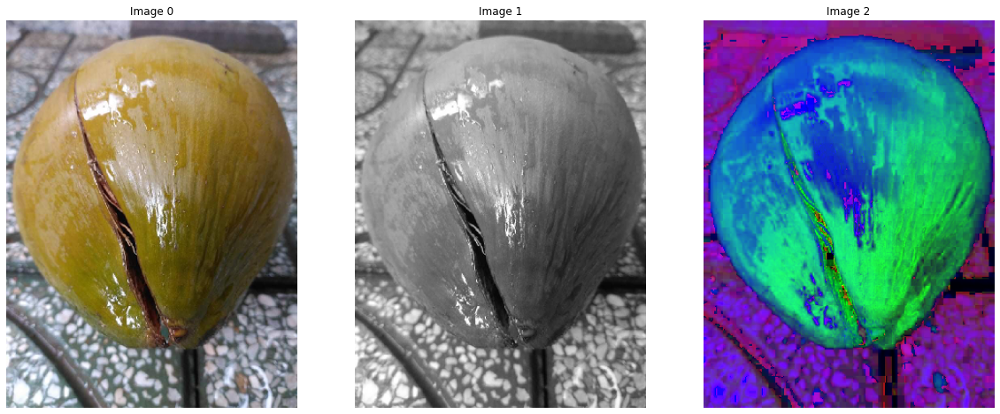

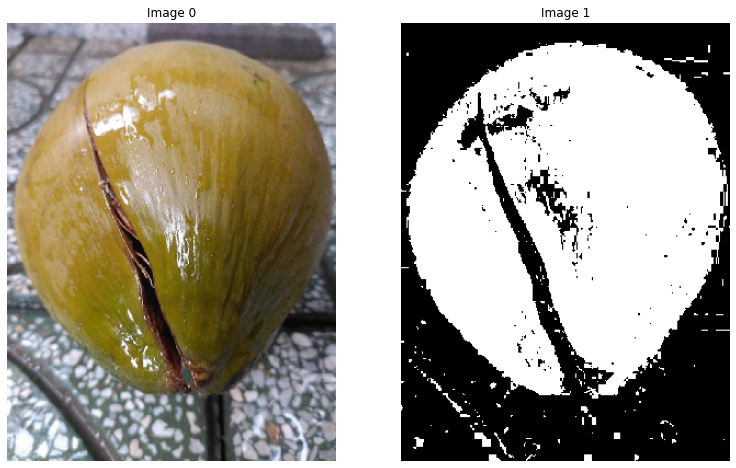

In [49]:
ChannelListNGA_Test = ReadImage('NG-A Coconut.jpg', info_resize = (300,0))
image_RGB = ChannelListNGA_Test[0]
image_GRAY = ChannelListNGA_Test[1]
image_HSV = ChannelListNGA_Test[2]

thresh = (15, 45)
channel = image_HSV[:,:,0]
mask_full = (channel > thresh[0]) & (channel < thresh[1])
ShowImage([image_RGB, mask_full], 1, 3)

NG-B Coconut

NG-B Coconut.jpg shape: (533, 300, 3)


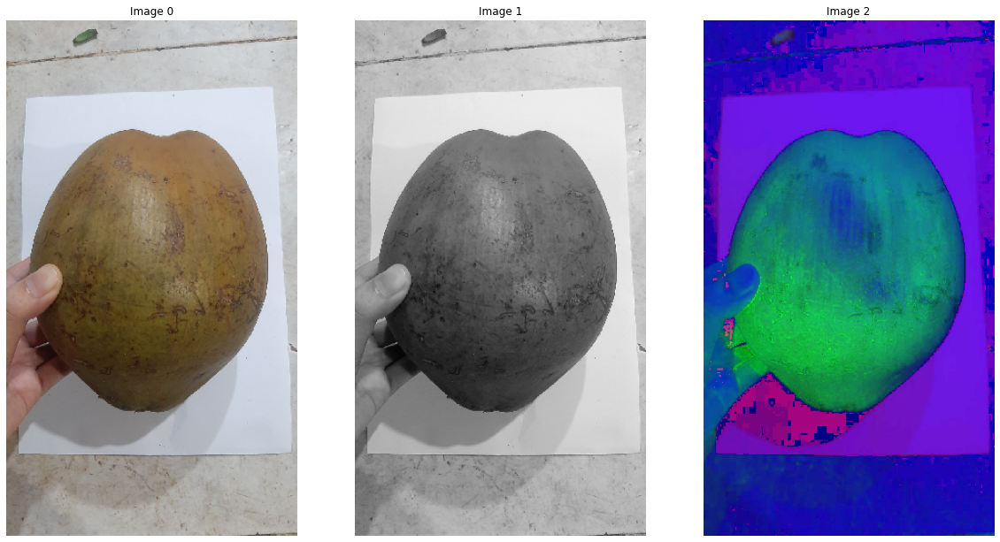

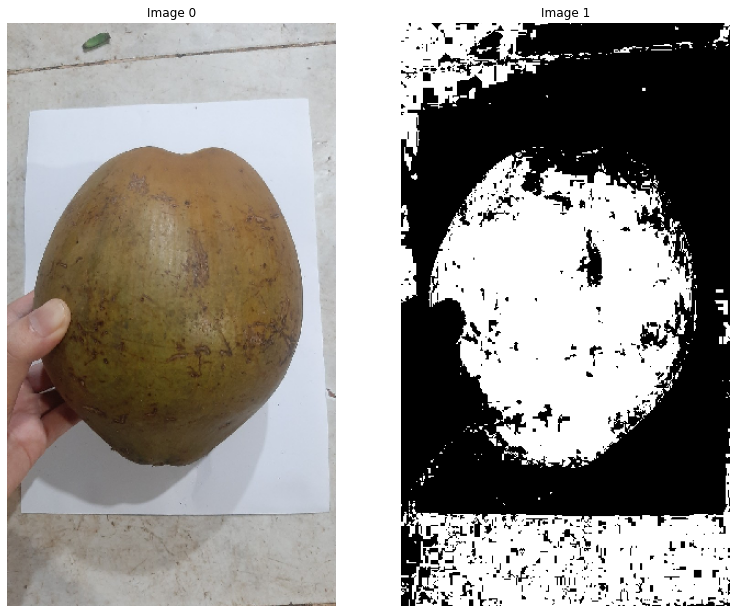

In [50]:
ChannelListNGB_Test = ReadImage('NG-B Coconut.jpg', info_resize = (300,0))
image_RGB = ChannelListNGB_Test[0]
image_GRAY = ChannelListNGB_Test[1]
image_HSV = ChannelListNGB_Test[2]

thresh = (15, 45)
channel = image_HSV[:,:,0]
mask_full = (channel > thresh[0]) & (channel < thresh[1])
ShowImage([image_RGB, mask_full], 1, 3)

## Segmentation

Good Coconut.jpg shape: (400, 300, 3)


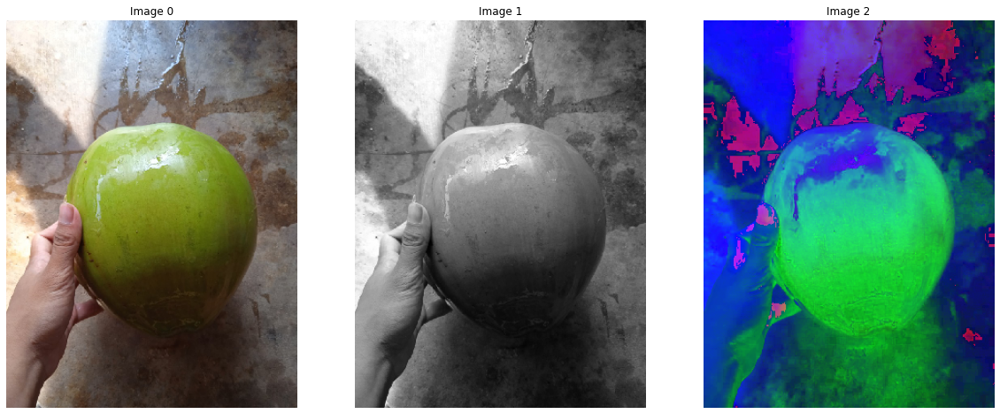

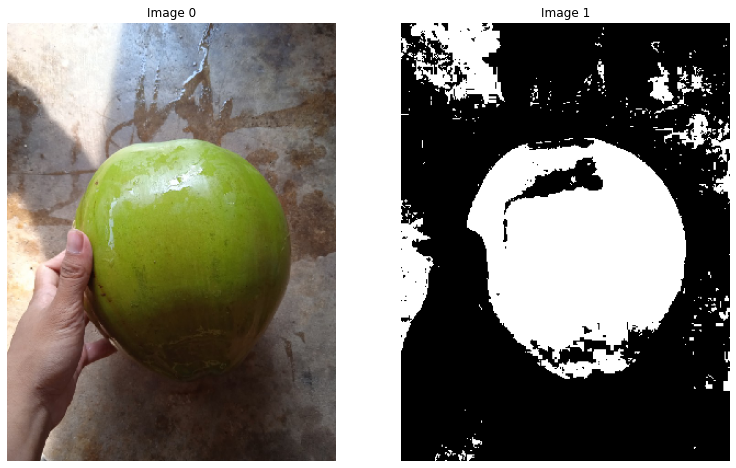

In [51]:
Object_thresh = (15,45)
resize_info = (300,0)

ChannelListG_Test = ReadImage('Good Coconut.jpg', info_resize = resize_info)
image_RGB, image_GRAY, image_HSV = ChannelListG_Test[0], ChannelListG_Test[1], ChannelListG_Test[2]

# Kênh Hue.
# channel ở đây là ma trận kênh Hue.
channel = image_HSV[:,:,0]
image_mask = (channel > thresh[0]) & (channel < thresh[1])
ShowImage([image_RGB, image_mask], 1, 3)

image_mask_org = image_mask.copy()

### Fill holes

In [52]:
# Hàm Fill holes giúp trám lỗ

def fillholes(mask):
  from scipy import ndimage as ndi
  # ndi.binary_fill_holes: giúp trám lỗ
  result = ndi.binary_fill_holes(mask)
  return result

  """
  - erosion: giúp thu nhỏ vùng.
  - dilation: giúp phóng to vùng.
  - opening: erosion -> dilation.
  - closing: dilation -> erosion.
  - white_tophat: lấy phần sáng nhất.
  """
def morphology(mask, size):
    from skimage.morphology import erosion, dilation, opening, closing, white_tophat
    from skimage.morphology import disk
    # se: structuring element: giống cửa sổ trượt khắp bức ảnh.
    # disk: structuring element có dạng hình tròn (số 1 nằm kiểu hình tròn)
    se = disk(abs(size))
    if(size > 0):
        result = dilation(mask, se)
    else:
        result = erosion(mask, se)  
    return result

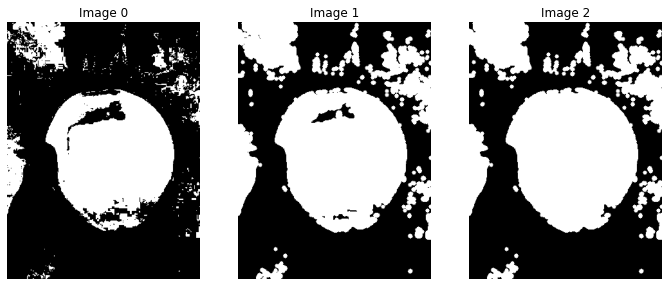

In [53]:
mask = image_mask.copy()
mask1 = morphology(mask, 3)
mask2 = fillholes(mask1)

ShowImage([mask, mask1, mask2], 1, 5)

In [54]:
def region_analysis(mask, image_value):
  from skimage.measure import label, regionprops

  # Đánh số từng vùng trên bức ảnh
  image_label = label(mask) 
  print(f"Index of each region from 1 to {image_label.max()}.")

  # Thống kê thông tin của từng vùng
  regions = regionprops(image_label, intensity_image=image_value, coordinates='rc')
  ColList = ["label", "at_row", "at_col", 
            "area", "minr", "minc", "maxr", "maxc", "width", "height", "max_intensity", "mean_intensity", "min_intensity",]

  LabelDF = pd.DataFrame(columns = ColList)
  for props in regions:
      RowList = []
      label = props.label
      if("label" in ColList):
          RowList.append(label)

      at_row, at_col = props.centroid
      if("at_row" in ColList):
          RowList.append(at_row)

      if("at_col" in ColList):
          RowList.append(at_col)

      if("area" in ColList):
          RowList.append(props.area)

      minr, minc, maxr, maxc = props.bbox
      if("minr" in ColList):
          RowList.append(minr)

      if("minc" in ColList):
          RowList.append(minc)

      if("maxr" in ColList):
          RowList.append(maxr)

      if("maxc" in ColList):
          RowList.append(maxc)

      if("width" in ColList):
          RowList.append(maxc - minc)

      if("height" in ColList):
          RowList.append(maxr - minr)

      if("max_intensity" in ColList):
          RowList.append(props.max_intensity)

      if("mean_intensity" in ColList):
          RowList.append(props.mean_intensity)

      if("min_intensity" in ColList):
          RowList.append(props.min_intensity)

      LabelDF.loc[label-1, 0 : len(RowList)] = RowList

  LabelDF = LabelDF.sort_values(by = "area", ascending = False)
  LabelDF = LabelDF.reset_index(drop = True)
  # LabelDF.head()

  return LabelDF, image_label

In [55]:
LabelDF, image_label = region_analysis(mask2, image_GRAY)

LabelDF.head()

Index of each region from 1 to 42.


,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
0,21,208.651982,161.887109,34458,102,57,328,263,206,226,255,103.966452,11
1,1,36.867265,50.723309,6238,0,0,93,98,98,93,255,241.172812,157
2,15,112.61457,275.917219,3020,71,227,173,300,73,102,154,98.9,41
3,27,222.881285,11.511522,2864,158,0,302,38,38,144,255,224.581006,106
4,7,60.713946,248.060618,2524,33,197,90,298,101,57,216,106.04794,45


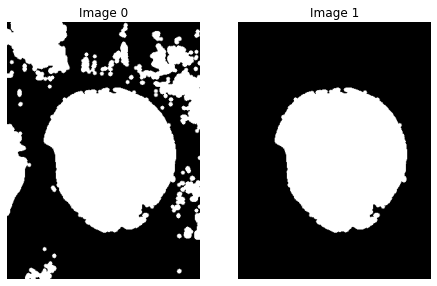

In [56]:
max_index = LabelDF.loc[0, "label"] # 21

# mask2 gọi là Candidate
# mask3 gọi là RoIs (Regions of Interest)
mask3 = image_label == max_index

ShowImage([mask2, mask3], 1, 5)

### SegmentColorImageByMask

In [57]:
def SegmentColorImageByMask(IM, Mask):
  """
  SegmentColorImageByMask dùng để segment object màu.
  - Mask: phải đưa Mask này về uint8.
  """
  Mask = Mask.astype(np.uint8)
  result = cv2.bitwise_and(IM,IM, mask = Mask)
  return result

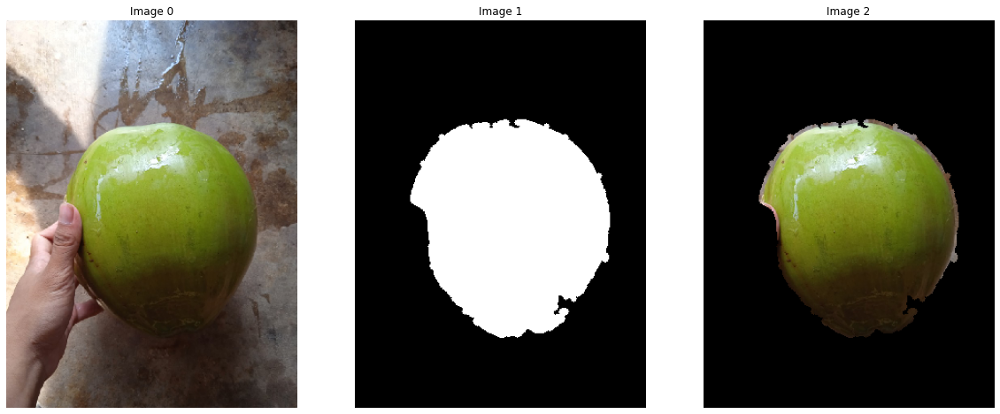

In [58]:
image_seg_RGB = image_RGB.copy()

image_seg_RGB = SegmentColorImageByMask(image_seg_RGB, mask3)

ShowImage([image_RGB, mask3, image_seg_RGB],1,3)